# Loading Libraries

In [ ]:
import pandas as pd 
import numpy as np
import os
import glob
from darts import TimeSeries
from darts.models.forecasting.xgboost import XGBModel
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('../processedData/Sku_shop_based_data/BE20196_BE_SHOP_DACH.csv')
df.head()
df['date'] = pd.to_datetime(df['date'],format='%Y-%m-%d')


# XGBModel

## spliting data into training and testing

In [13]:
series = TimeSeries.from_dataframe(df,time_col='date',value_cols=['quantity'],freq='D',fill_missing_dates=True,fillna_value=0)
train_series , test_series = series.split_after(0.80)


In [15]:

xgb_model =XGBModel(lags=10,
                output_chunk_length=15,
                random_state=1999,
                multi_models=True,
                lags_future_covariates=None,
                lags_past_covariates=None
                
                
            )
xgb_model.fit(train_series)



XGBModel(lags=10, lags_past_covariates=None, lags_future_covariates=None, output_chunk_length=15, add_encoders=None, likelihood=None, quantiles=None, random_state=1999, multi_models=True, use_static_covariates=True)

## Training Data of BE20196_BE_SHOP_DACH

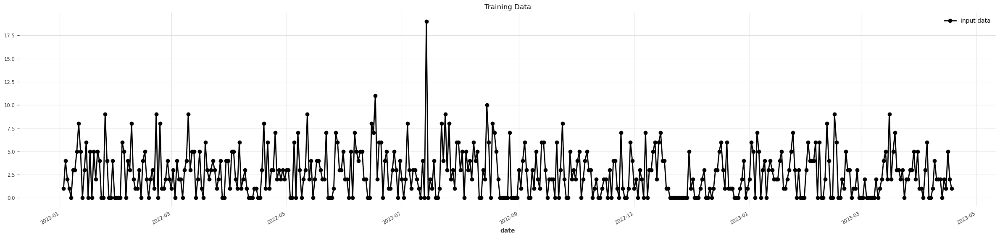

In [16]:
plt.figure(figsize =(30,6))
train_series.plot(label='input data',marker='o')
plt.title('Training Data')
plt.show()

## Testing Data from BE20196_BE_SHOP_DACH

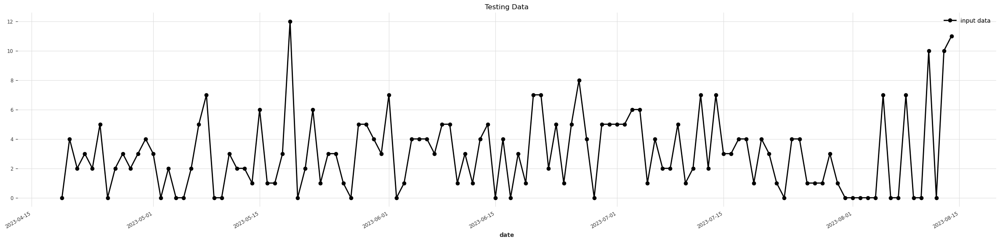

In [17]:
plt.figure(figsize =(30,6))
test_series.plot(label='input data',marker='o')
plt.title('Testing Data')
plt.show()

## Results of XGBMODEL & Model Evaluation using sliding window size 1

74


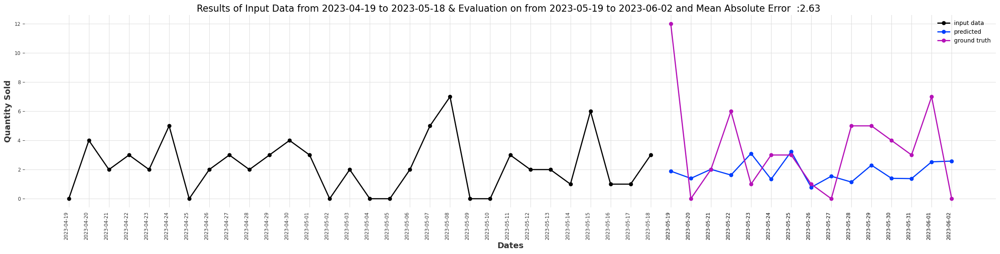

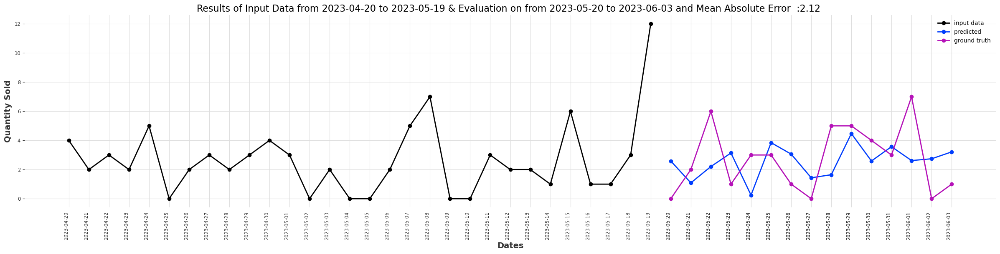

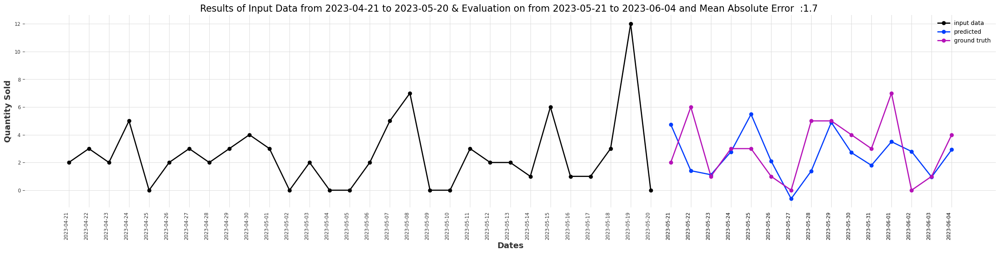

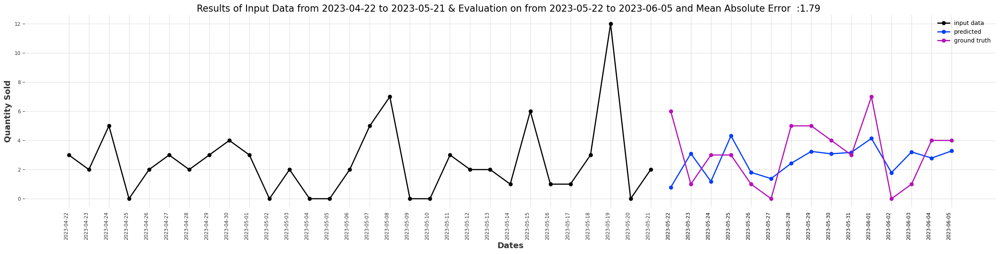

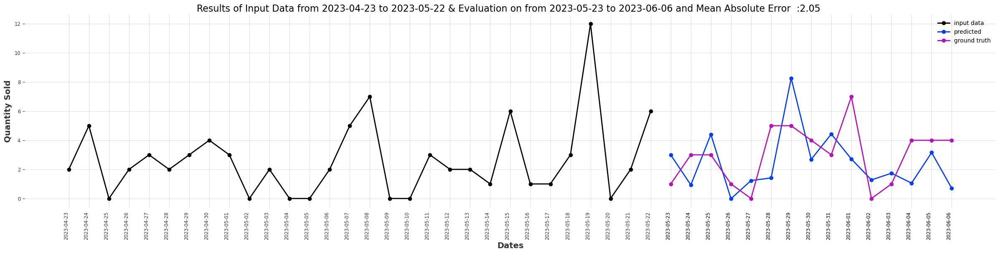

...

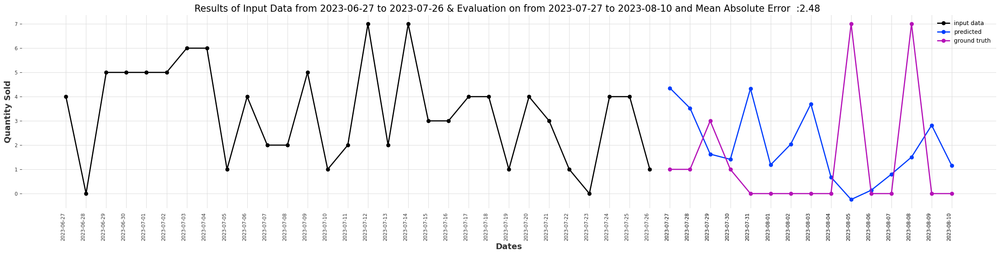

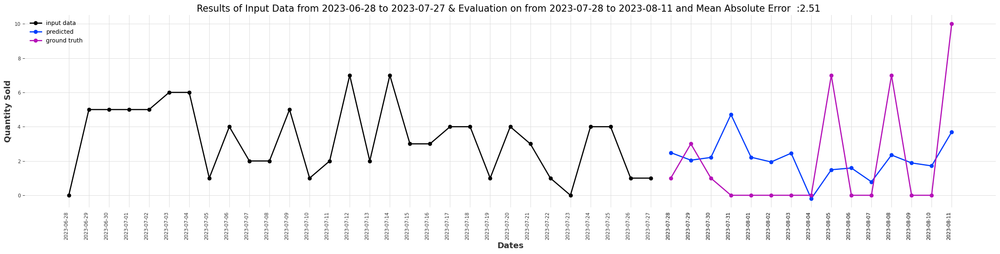

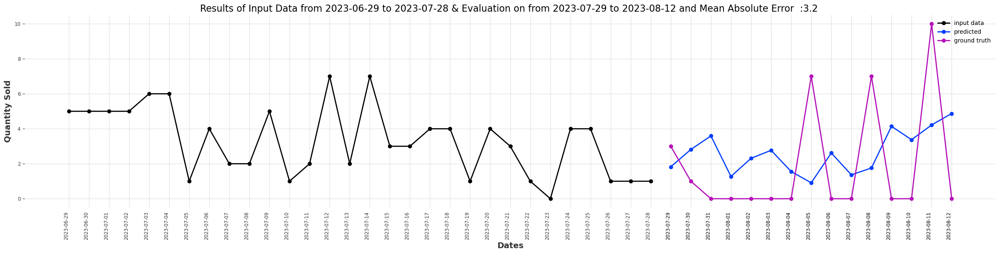

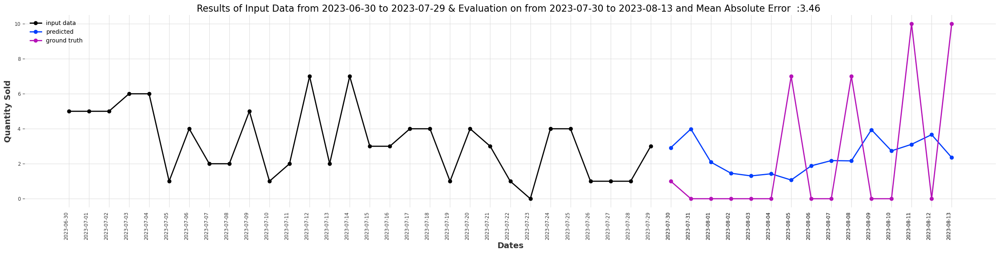

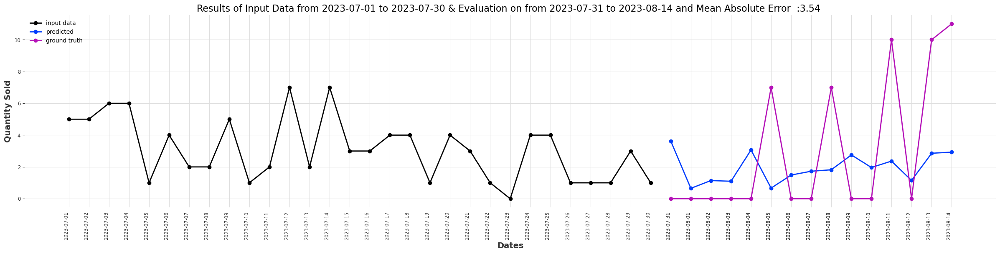

In [18]:
os.makedirs('../ResultsPlots/xgbmodel',exist_ok=True)
window_size = 30
prediction_horizon = 15
slide_step = 1
num_predictions = len(test_series) - window_size - prediction_horizon + 1

predictions = []
print(num_predictions)
for i in range(num_predictions):
#     # Extract the input window
    input_window = test_series[i:i + window_size]
    ground_truth = test_series[i+window_size:i+window_size+prediction_horizon]
#     # Predict the next points
    forecast = xgb_model.predict(n=prediction_horizon , series =input_window)
    # print("Input Data",(i,i+window_size))
    # print("Input Data",(i+window_size))


#     # Add the predicted values to the list of predictions
    predictions.append(forecast.values())
     # Calculate MAE and MAPE
    mae = np.round(np.mean(np.abs(ground_truth.values() - forecast.values())),2)
    
    plt.figure(figsize =(30,6))
    input_window.plot(label='input data',marker='o')
    forecast.plot(label='predicted',marker='o')
    ground_truth.plot(label='ground truth',marker='o')
    combined_time_index = input_window.time_index.append(forecast.time_index).append(ground_truth.time_index)

    starting_date_of_input_data = input_window.time_index[0].strftime("%Y-%m-%d")
    ending_date_of_input_data = input_window.time_index[-1].strftime("%Y-%m-%d")
    starting_date_predicted = forecast.time_index[0].strftime("%Y-%m-%d")
    ending_date_of_predicted = forecast.time_index[-1].strftime("%Y-%m-%d")
    
    plt.xticks(combined_time_index, combined_time_index.strftime('%Y-%m-%d'), rotation=90)
    plt.title(f'Results of Input Data from {starting_date_of_input_data} to {ending_date_of_input_data} & Evaluation on from {starting_date_predicted} to {ending_date_of_predicted} and Mean Absolute Error  :{mae} ',fontsize=16)
    plt.ylabel('Quantity Sold',fontsize=14)
    plt.xlabel('Dates',fontsize=14)
    plt.savefig(f'../ResultsPlots/xgbmodel/input_window{i}_{i+window_size}')
    plt.legend()
    plt.show()
    # break
# # Create a TimeSeries object for the predicted values
# predicted_series = TimeSeries.from_times_and_values(test_series.time_index[window_size:], predictions)

# # Evaluate or visualize the predicted_series as needed


# ARIMA Model

In [ ]:
from darts.models.forecasting.arima import ARIMA
arima_model = ARIMA(p=12,d=1,q=0,seasonal_order=(0, 0, 0, 0), random_state=True)

arima_model.fit(train_series)


In [ ]:
os.makedirs('../ResultsPlots/arima_results',exist_ok=True)
window_size = 30
prediction_horizon = 15
slide_step = 1
num_predictions = len(test_series) - window_size - prediction_horizon + 1

predictions = []
print(num_predictions)
for i in range(num_predictions):
#     # Extract the input window
    input_window = test_series[i:i + window_size]
    ground_truth = test_series[i+window_size:i+window_size+prediction_horizon]
#     # Predict the next points
    arima_forecast = arima_model.predict(n=prediction_horizon , series =input_window)
    # print("Input Data",(i,i+window_size))
    # print("Input Data",(i+window_size))


     # Calculate MAE and MAPE
    mae = np.round(np.mean(np.abs(ground_truth.values() - arima_forecast.values())),2)
    
    plt.figure(figsize =(30,6))
    input_window.plot(label='input data',marker='o')
    arima_forecast.plot(label='predicted',marker='o')
    ground_truth.plot(label='ground truth',marker='o')
    combined_time_index = input_window.time_index.append(arima_forecast.time_index).append(ground_truth.time_index)

    starting_date_of_input_data = input_window.time_index[0].strftime("%Y-%m-%d")
    ending_date_of_input_data = input_window.time_index[-1].strftime("%Y-%m-%d")
    starting_date_predicted = arima_forecast.time_index[0].strftime("%Y-%m-%d")
    ending_date_of_predicted = arima_forecast.time_index[-1].strftime("%Y-%m-%d")
    
    plt.xticks(combined_time_index, combined_time_index.strftime('%Y-%m-%d'), rotation=90)
    plt.title(f'Results of Input Data from {starting_date_of_input_data} to {ending_date_of_input_data} & Evaluation on from {starting_date_predicted} to {ending_date_of_predicted} and Mean Absolute Error  :{mae} ',fontsize=16)
    plt.ylabel('Quantity Sold',fontsize=14)
    plt.xlabel('Dates',fontsize=14)
    plt.legend()
    plt.savefig(f'../ResultsPlots/arima_results/input_window{i}_{i+window_size}')
    # plt.show()
    # break

